<a href="https://colab.research.google.com/github/tuyetlan15/ATI/blob/main/Copy_of_NPL_Text_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import re
import nltk
nltk.download('stopwords')
nltk.download('wordnet')

'''
Preprocess a string.
:parameter
    :param text: string - name of column containing text
    :param lst_stopwords: list - list of stopwords to remove
    :param flg_stemm: bool - whether stemming is to be applied
    :param flg_lemm: bool - whether lemmitisation is to be applied
:return
    cleaned text
'''

def utils_preprocess_text(text, flg_stemm=False, flg_lemm=True, lst_stopwords=None):
  ## clean (convert to lowercase and remove punctuations and characters and then strip)
  text = re.sub(r'[^\w\s]', '', str(text).lower().strip())

  ## Tokenize (convert from string to list)
  lst_text = text.split()    ## remove Stopwords
  if lst_stopwords is not None:
    lst_text = [word for word in lst_text if word not in lst_stopwords]

  ## Stemming (remove -ing, -ly, ...)
  if flg_stemm == True:
    ps = nltk.stem.porter.PorterStemmer()
    lst_text = [ps.stem(word) for word in lst_text]

  ## Lemmatisation (convert the word into root word)
  if flg_lemm == True:
    lem = nltk.stem.wordnet.WordNetLemmatizer()
    lst_text = [lem.lemmatize(word) for word in lst_text]

  ## back to string from list
  text = " ".join(lst_text)
  return text


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


# Introduction

Text classification is an important NPL task. In this tutorial, we will practice with 3 different strategies for text multiclass classification:
* The old-fashioned Bag-of-Words (with Tf-Idf )
* The popular Word Embedding (with Word2Vec) and LSTM
* The cutting edge Transformer Language models (with BERT)



In particular, we will go through:

1. Load text data and perform preprocessing
2. Bag-of-Words: Feature Engineering & Feature Selection & Machine Learning with scikit-learn, Testing & Evaluation, Explainability with lime.
3. Word Embedding: Fitting a Word2Vec with gensim, Feature Engineering & Deep Learning with tensorflow/keras, Testing & Evaluation, Explainability with the Attention mechanism.
4. Transformer Language Models: Feature Engineering with transformers, Transfer Learning from pre-trained BERT with transformers and tensorflow/keras, Testing & Evaluation.



# Dataset and Preprocessing

We will use the **"News category dataset”** in which we are provided with news headlines from the year 2012 to 2018 obtained from HuffPost and we are asked to classify them with the right category, therefore this is a multiclass classification problem.

The dataset can be downloaded from the following link:

[https://drive.google.com/file/d/1mQHOImesDOqoEi6EHBPznoGeJTMD-4r3/view?usp=sharing](https://drive.google.com/file/d/1mQHOImesDOqoEi6EHBPznoGeJTMD-4r3/view?usp=sharing)

## Load dataset

Firstly we will load the dataset into a Pandax Dataframe:

In [ ]:
import json
import pandas as pd
import numpy as np

In [ ]:
# reading the JSON file
dtf = pd.read_json('data_news.json', orient ='split', compression = 'infer')

print(dtf.shape)

## print 10 random rows
dtf.sample(10)

(50879, 2)


,label,text
97266,POLITICS,Computerized School Testing Off To A Rocky Sta...
39812,POLITICS,Labor Secretary Tom Perez Jumps Into The Race ...
85217,ENTERTAINMENT,'Breaking Bad' Actor Runs For Albuquerque Seat
93973,POLITICS,"Unlike Father, Rand Paul Is Willing to Alter H..."
880,POLITICS,The RNC Is Selling 'Sickening' Donald Trump-Th...
52732,ENTERTAINMENT,The Best Reason Yet To Love Disney's Newest Pr...
81513,ENTERTAINMENT,"VMAs Winners List 2015 Includes Taylor Swift, ..."
120172,ENTERTAINMENT,5 Stars Whose Perfect Teeth Are Fake
75589,POLITICS,"HuffPost Rise Morning Newsbrief, November 4"
35137,ENTERTAINMENT,"Yes, Please: Annette Bening Will Star In The N..."


The code in the cell above performs the initial loading and inspection of your dataset.

1.  **Import Libraries:** It starts by importing `json` for working with JSON data, `pandas` for data manipulation (specifically DataFrames), and `numpy` for numerical operations (though `numpy` is not directly used in the lines provided here, it's often used in conjunction with pandas).
2.  **Load Data:** `pd.read_json('data_news.json', orient ='split', compression = 'infer')` reads the data from the specified JSON file into a pandas DataFrame named `dtf`.
    *   `'data_news.json'` is the name of the file being read.
    *   `orient='split'` tells pandas to expect the JSON data to be in a format where the data is separated from the index, columns, and schema.
    *   `compression='infer'` tells pandas to automatically detect the compression format of the file (like gzip, bz2, etc.).
3.  **Print Shape:** `print(dtf.shape)` displays the dimensions of the loaded DataFrame as a tuple `(number of rows, number of columns)`.
4.  **Sample Data:** `dtf.sample(10)` randomly selects and displays 10 rows from the DataFrame. This is a quick way to preview the data's structure and content without printing the entire dataset.

The output you see is:
*   **(50879, 2)**: This is the output of `print(dtf.shape)`, indicating that your DataFrame has 50,879 rows and 2 columns.
*   A table showing 10 randomly selected rows from the DataFrame. Each row has two columns: `label` (which likely represents the news category) and `text` (which contains the news headline).

This code successfully loads your dataset and provides a basic overview of its size and a sample of its content.

## Plot the categories distributions

In order to understand the composition of the dataset, we are going to look into the `univariate distribution` of the target by showing labels frequency with a bar plot:

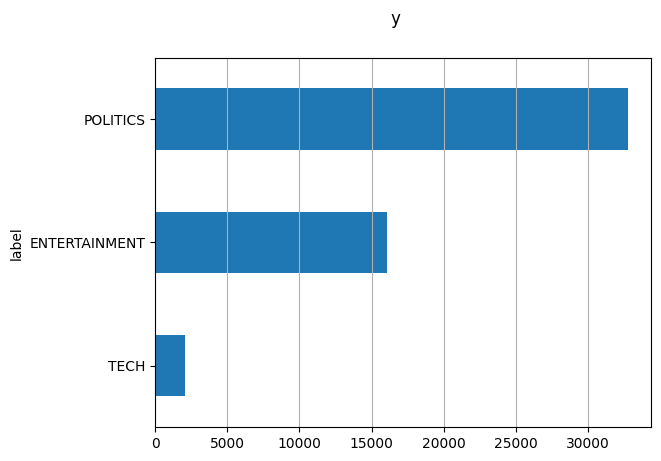

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots()
fig.suptitle("y", fontsize=12)

dtf["label"].reset_index().groupby("label").count().sort_values(by= "index").plot(kind="barh", legend=False, ax=ax).grid(axis='x')

plt.show()

The code in the cell above generates a horizontal bar plot to visualize the distribution of news categories in your dataset.

1.  **Import Library:** It imports the `matplotlib.pyplot` library for plotting.
2.  **Create Figure and Axes:** `fig, ax = plt.subplots()` creates a figure and a set of axes for the plot.
3.  **Set Title:** `fig.suptitle("y", fontsize=12)` sets the title of the figure.
4.  **Prepare Data for Plotting:** The code then prepares the data by counting the occurrences of each unique label in the "label" column and sorting these counts.
5.  **Plot Data:** `.plot(kind="barh", legend=False, ax=ax).grid(axis='x')` creates the horizontal bar plot with a grid on the x-axis.
6.  **Show Plot:** `plt.show()` displays the generated plot.

The output is a horizontal bar chart showing the frequency of each news category. It clearly illustrates the imbalance in the dataset, with "POLITICS" having the most headlines, followed by "ENTERTAINMENT", and "TECH" having significantly fewer.

In 50,879 headlines in the dataset, there are approximately 35,000 Politics headlines, 18,000 Entertainment headlines, and 2,500 Technology headlines.

The dataset is imbalanced: the proportion of Tech news is really small compared to the others, this will make for models to recognize Tech news rather tough.

## Text preprocessing

We are going to a function for preprocessing by cleaning text, removing stop words, and applying lemmatization:

In [ ]:
import re
import nltk
nltk.download('stopwords')
nltk.download('wordnet')

'''
Preprocess a string.
:parameter
    :param text: string - name of column containing text
    :param lst_stopwords: list - list of stopwords to remove
    :param flg_stemm: bool - whether stemming is to be applied
    :param flg_lemm: bool - whether lemmitisation is to be applied
:return
    cleaned text
'''

def utils_preprocess_text(text, flg_stemm=False, flg_lemm=True, lst_stopwords=None):
  ## clean (convert to lowercase and remove punctuations and characters and then strip)
  text = re.sub(r'[^\w\s]', '', str(text).lower().strip())

  ## Tokenize (convert from string to list)
  lst_text = text.split()    ## remove Stopwords
  if lst_stopwords is not None:
    lst_text = [word for word in lst_text if word not in lst_stopwords]

  ## Stemming (remove -ing, -ly, ...)
  if flg_stemm == True:
    ps = nltk.stem.porter.PorterStemmer()
    lst_text = [ps.stem(word) for word in lst_text]

  ## Lemmatisation (convert the word into root word)
  if flg_lemm == True:
    lem = nltk.stem.wordnet.WordNetLemmatizer()
    lst_text = [lem.lemmatize(word) for word in lst_text]

  ## back to string from list
  text = " ".join(lst_text)
  return text


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


We can create a list of generic stop words for the English vocabulary with `nltk` (we could edit this list by adding or removing words):

In [ ]:
lst_stopwords = nltk.corpus.stopwords.words("english")
#lst_stopwords

Now We apply the text preprocessing function `utils_preprocess_text` on the whole dataset and store the result in a new column named `text_clean` so that we can choose to work with the raw corpus or the preprocessed text.

In [ ]:
dtf["text_clean"] = dtf["text"].apply(lambda x: utils_preprocess_text(x, flg_stemm=False, flg_lemm=True, lst_stopwords=lst_stopwords))
dtf.head()

,label,text,text_clean
1,ENTERTAINMENT,Will Smith Joins Diplo And Nicky Jam For The 2...,smith join diplo nicky jam 2018 world cup offi...
2,ENTERTAINMENT,Hugh Grant Marries For The First Time At Age 57,hugh grant marries first time age 57
3,ENTERTAINMENT,Jim Carrey Blasts 'Castrato' Adam Schiff And D...,jim carrey blast castrato adam schiff democrat...
4,ENTERTAINMENT,Julianna Margulies Uses Donald Trump Poop Bags...,julianna margulies us donald trump poop bag pi...
5,ENTERTAINMENT,Morgan Freeman 'Devastated' That Sexual Harass...,morgan freeman devastated sexual harassment cl...


The code in the cells above performs text preprocessing on the 'text' column of the DataFrame.

1.  It imports the `re` and `nltk` libraries and downloads necessary data.
2.  It defines a function `utils_preprocess_text` that cleans text by converting to lowercase, removing punctuation, removing stopwords, and applying lemmatization.
3.  It creates a list of common English stopwords.
4.  It applies the `utils_preprocess_text` function to the 'text' column, using the defined stopwords and enabling lemmatization, storing the result in a new column 'text_clean'.
5.  Finally, it displays the first five rows of the DataFrame, showing the original and preprocessed text.

The output displays the first five rows of the DataFrame, demonstrating the effect of the preprocessing by showing the cleaned text in the 'text_clean' column.

# Bag of words

## Introduction

The **Bag-of-Words** model is simple: it builds a vocabulary from a corpus of headlines and counts how many times the words appear in each headline.

To put it another way, each word in the vocabulary becomes a feature and a headline is represented by a vector with the same length of the vocabulary (a “bag of words”).

For instance, let’s take 3 headlines and represent them with this approach:

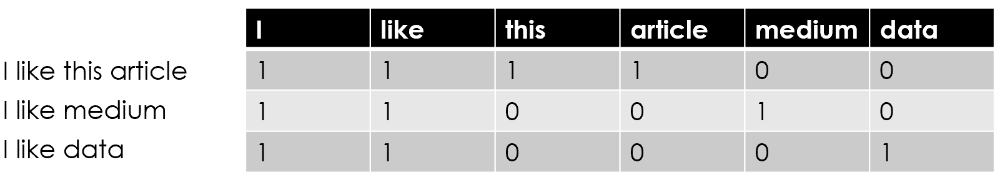

## Create a bag of words

We will create a bag of words by by extracting words from the 50,879 headlines.

We will limit the number of words in our "bag" to 10,000 words (so the length of the vocabulary will be 10k).

We will also capture unigrams (i.e. “new” and “york”) and bigrams (i.e. “new york”).

We will use sklearn library to create our bag of words:

In [ ]:
import nltk
from sklearn import feature_extraction

In [ ]:
vectorizer = feature_extraction.text.CountVectorizer(max_features=10000, ngram_range=(1,2))
corpus = dtf["text_clean"]
vectorizer.fit(corpus)
input_data = vectorizer.transform(corpus)
dic_vocabulary = vectorizer.vocabulary_
print(len(dic_vocabulary))
print(dic_vocabulary)
print(input_data.shape)

10000
{'smith': np.int64(8142), 'join': np.int64(4689), 'jam': np.int64(4549), '2018': np.int64(67), 'world': np.int64(9865), 'cup': np.int64(2138), 'official': np.int64(6212), 'song': np.int64(8200), 'hugh': np.int64(4233), 'grant': np.int64(3790), 'marries': np.int64(5438), 'first': np.int64(3314), 'time': np.int64(8840), 'age': np.int64(293), 'first time': np.int64(3333), 'jim': np.int64(4636), 'carrey': np.int64(1426), 'blast': np.int64(1048), 'adam': np.int64(234), 'schiff': np.int64(7746), 'democrat': np.int64(2358), 'new': np.int64(5958), 'artwork': np.int64(620), 'jim carrey': np.int64(4637), 'adam schiff': np.int64(237), 'democrat new': np.int64(2366), 'us': np.int64(9409), 'donald': np.int64(2628), 'trump': np.int64(9026), 'bag': np.int64(759), 'pick': np.int64(6556), 'dog': np.int64(2614), 'donald trump': np.int64(2629), 'morgan': np.int64(5775), 'freeman': np.int64(3486), 'devastated': np.int64(2463), 'sexual': np.int64(7939), 'harassment': np.int64(3937), 'claim': np.int64

Now we have a bag of 10,000 words, we will see how the first headline is represented by a vector of 10,000 elements:

In [ ]:
# Print out the first headline
print(corpus.iloc[0])

# Print out all words in the first headline that exist in the bag of words
for word in corpus.iloc[0].split():
  if word in dic_vocabulary:
    print(word, ' : ', dic_vocabulary[word])

# Print out the corresponding vector for the first headline
print(input_data[0])

smith join diplo nicky jam 2018 world cup official song
smith  :  8142
join  :  4689
jam  :  4549
2018  :  67
world  :  9865
cup  :  2138
official  :  6212
song  :  8200
<Compressed Sparse Row sparse matrix of dtype 'int64'
	with 8 stored elements and shape (1, 10000)>
  Coords	Values
  (0, 67)	1
  (0, 2138)	1
  (0, 4549)	1
  (0, 4689)	1
  (0, 6212)	1
  (0, 8142)	1
  (0, 8200)	1
  (0, 9865)	1


## Feature engineering

The feature matrix `input_data` has a shape of 50,879 (Number of headlines) x 10,000 (Length of vocabulary) and it’s pretty sparse:

Text(0.5, 1.0, 'Sparse Matrix Sample')

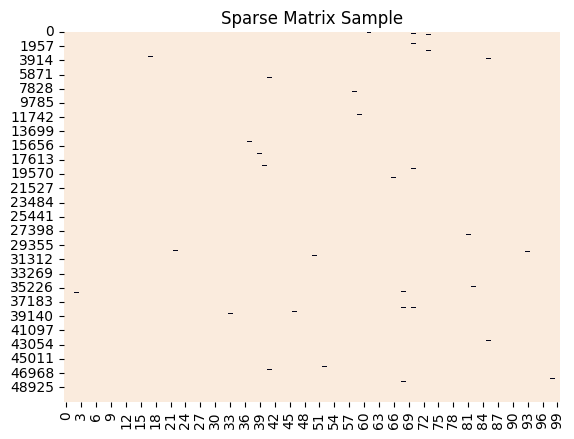

In [ ]:
import seaborn as sns

sns.heatmap(input_data.todense()[:,np.random.randint(0,input_data.shape[1],100)]==0, vmin=0, vmax=1, cbar=False).set_title('Sparse Matrix Sample')

We should try to drop some columns and reduce the matrix dimensionality.

To do so, we can carry out some **Feature Selection**, the process of selecting a subset of relevant variables. we will proceed as follows:

1. treat each category as binary (for example, the “Tech” category is 1 for the Tech news and 0 for the others);
2. perform a Chi-Square test to determine whether a feature and the (binary) target are independent;
3. keep only the features with a certain p-value from the Chi-Square test.


In [ ]:
from sklearn import feature_selection

y = dtf["label"]
word_list = vectorizer.vocabulary_.keys()
p_value_limit = 0.95
dtf_features = pd.DataFrame()
for cat in np.unique(y):
    chi2, p = feature_selection.chi2(input_data, y == cat)
    dtf_features = pd.concat([dtf_features, pd.DataFrame({"feature" : word_list, "score" : 1-p, "y" : cat})], ignore_index=True)
    dtf_features = dtf_features.sort_values(["y","score"], ascending=[True,False])
    dtf_features = dtf_features[dtf_features["score"] > p_value_limit]
word_list = dtf_features["feature"].unique().tolist()


In [ ]:
print(len(word_list))
print(word_list)

7196
['act', 'sesame street', 'emilia', 'clarke', 'scene', 'would', 'say never', 'mayer', 'amid', 'ignoring', 'tomi lahren', 'abruptly', 'neglect', 'running', 'win', 'ashton kutcher', 'room', 'wrecking ball', 'fan', 'nypd', 'violence', 'saying', 'call', 'prosecutor', 'split', 'suing', 'roseanne', 'idris elba', 'progress', 'deal', 'invited', 'union', 'clearance', 'arizona', 'dating', 'store', 'gop governor', 'dangerous', 'illegal', 'onion', 'walkout', 'transgender', 'abandon', 'swamp', 'billboard music', 'voter', 'judge order', 'hired', 'ben affleck', 'fox news', 'american get', 'russia probe', 'adorable', 'teigen john', 'john legend', 'tout', 'showdown', 'jeff session', 'rep', 'headed', 'saved', 'medium', 'admits', 'next year', 'doesnt know', 'inauguration', 'since', 'enjoy', 'point', 'haspel', 'confirmed', 'tap', 'grey anatomy', 'release new', 'issue', 'vanity fair', 'blow', 'left', 'pink', 'response', 'looked', 'software', 'search', 'suspect', 'adoption', 'official say', 'elizabeth',

By using Feature Selection technique, we have reduced the number of features from 10,000 to 7,187 by keeping the most statistically relevant ones.

Let’s print some of top statistically relevant words for each category:

In [ ]:
for cat in np.unique(y):
   print("# {}:".format(cat))
   print("  . selected features:",
         len(dtf_features[dtf_features["y"]==cat]))
   print("  . top features:", ",".join(dtf_features[dtf_features["y"]==cat]["feature"].values[:20]))
   print(" ")

# ENTERTAINMENT:
  . selected features: 5972
  . top features: act,sesame street,emilia,clarke,scene,would,say never,mayer,amid,ignoring,tomi lahren,abruptly,neglect,running,win,ashton kutcher,room,wrecking ball,fan,nypd
 
# POLITICS:
  . selected features: 6636
  . top features: act,sesame street,emilia,clarke,scene,would,say never,mayer,amid,ignoring,abruptly,dy,win,congressman,ashton kutcher,room,wrecking ball,nypd,declared,violence
 
# TECH:
  . selected features: 1020
  . top features: watch,critic,sexual assault,executive order,dy,gwyneth paltrow,declared,violence,house democrat,gun violence,facebook,see,georgia governor,13,miller,solo,metaphor,blake,hears,midterm
 


Now we can refit the vectorizer on the corpus by giving this new set of words as input.

That will produce a smaller feature matrix and a shorter vocabulary.

In [ ]:
vectorizer = feature_extraction.text.CountVectorizer(vocabulary=word_list)
vectorizer.fit(corpus)
dic_vocabulary = vectorizer.vocabulary_
print(len(dic_vocabulary))
print(dic_vocabulary)

7196
{'act': 0, 'sesame street': 1, 'emilia': 2, 'clarke': 3, 'scene': 4, 'would': 5, 'say never': 6, 'mayer': 7, 'amid': 8, 'ignoring': 9, 'tomi lahren': 10, 'abruptly': 11, 'neglect': 12, 'running': 13, 'win': 14, 'ashton kutcher': 15, 'room': 16, 'wrecking ball': 17, 'fan': 18, 'nypd': 19, 'violence': 20, 'saying': 21, 'call': 22, 'prosecutor': 23, 'split': 24, 'suing': 25, 'roseanne': 26, 'idris elba': 27, 'progress': 28, 'deal': 29, 'invited': 30, 'union': 31, 'clearance': 32, 'arizona': 33, 'dating': 34, 'store': 35, 'gop governor': 36, 'dangerous': 37, 'illegal': 38, 'onion': 39, 'walkout': 40, 'transgender': 41, 'abandon': 42, 'swamp': 43, 'billboard music': 44, 'voter': 45, 'judge order': 46, 'hired': 47, 'ben affleck': 48, 'fox news': 49, 'american get': 50, 'russia probe': 51, 'adorable': 52, 'teigen john': 53, 'john legend': 54, 'tout': 55, 'showdown': 56, 'jeff session': 57, 'rep': 58, 'headed': 59, 'saved': 60, 'medium': 61, 'admits': 62, 'next year': 63, 'doesnt know': 6

The new feature matrix `input_data` has a shape of 50,879 (Number of headlines) x 7,187 (New length of vocabulary).

Now we can create our training set and testing set:

In [ ]:
from sklearn.model_selection import train_test_split

y = dtf["label"]
dtf_train, dtf_test, y_train, y_test = train_test_split(dtf, y, test_size=0.3, random_state=20)

X_train = vectorizer.transform(dtf_train["text_clean"])
X_test = vectorizer.transform(dtf_test["text_clean"])

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(35615, 7196) (35615,)
(15264, 7196) (15264,)


## Specify a machine learning model

We will train a machine learning model and test it.
With this problem, we can use a Naive Bayes algorithm: a probabilistic classifier that makes use of Bayes’ Theorem, a rule that uses probability to make predictions based on prior knowledge of conditions that might be related.

This algorithm is the most suitable for such large dataset as it **considers each feature independently**, calculates the probability of each category, and then predicts the category with the highest probability.

In [ ]:
from sklearn import naive_bayes

model = naive_bayes.MultinomialNB()
model.fit(X_train, y_train)
predicted = model.predict(X_test)
predicted_prob = model.predict_proba(X_test)

## Evaluate the model

We can now evaluate the performance of the Bag-of-Words model We will use the following metrics:
* **Accuracy:** the fraction of predictions the model got right.
* **Confusion Matrix:** a summary table that breaks down the number of correct and incorrect predictions by each class.
* **ROC:** a plot that illustrates the true positive rate against the false positive rate at various threshold settings. The area under the curve (AUC) indicates the probability that the classifier will rank a randomly chosen positive observation higher than a randomly chosen negative one.
* **Precision:** the fraction of relevant instances among the retrieved instances.
* **Recall:** the fraction of the total amount of relevant instances that were actually retrieved.

In [ ]:
def print_metrics(metrics, y_test, predicted):
  y_test_array = pd.get_dummies(y_test, drop_first=False).values

  ## Accuracy, Precision, Recall
  accuracy = metrics.accuracy_score(y_test, predicted)
  auc = metrics.roc_auc_score(y_test, predicted_prob, multi_class="ovr")
  print("Accuracy:",  round(accuracy,2))
  print("Auc:", round(auc,2))
  print("Detail:")
  print(metrics.classification_report(y_test, predicted))

In [ ]:
from sklearn import metrics

print_metrics(metrics, y_test, predicted)

Accuracy: 0.9
Auc: 0.96
Detail:
               precision    recall  f1-score   support

ENTERTAINMENT       0.88      0.85      0.87      4782
     POLITICS       0.91      0.95      0.93      9838
         TECH       0.79      0.42      0.55       644

     accuracy                           0.90     15264
    macro avg       0.86      0.74      0.78     15264
 weighted avg       0.89      0.90      0.89     15264



In [ ]:
def plot_metrics(y_test, predicted):
  classes = np.unique(y_test)
  y_test_array = pd.get_dummies(y_test, drop_first=False).values

  ## Plot confusion matrix
  cm = metrics.confusion_matrix(y_test, predicted)
  fig, ax = plt.subplots()
  sns.heatmap(cm, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues, cbar=False)
  ax.set(xlabel="Pred", ylabel="True", xticklabels=classes, yticklabels=classes, title="Confusion matrix")
  plt.yticks(rotation=0)
  fig, ax = plt.subplots(nrows=1, ncols=2)

  ## Plot roc
  for i in range(len(classes)):
      fpr, tpr, thresholds = metrics.roc_curve(y_test_array[:,i],  predicted_prob[:,i])
      ax[0].plot(fpr, tpr, lw=3, label='{0} (area={1:0.2f})'.format(classes[i], metrics.auc(fpr, tpr)))
  ax[0].plot([0,1], [0,1], color='navy', lw=3, linestyle='--')
  ax[0].set(xlim=[-0.05,1.0], ylim=[0.0,1.05], xlabel='False Positive Rate', ylabel="True Positive Rate (Recall)", title="Receiver operating characteristic")
  ax[0].legend(loc="lower right")
  ax[0].grid(True)

  ## Plot precision-recall curve
  for i in range(len(classes)):
      precision, recall, thresholds = metrics.precision_recall_curve(y_test_array[:,i], predicted_prob[:,i])
      ax[1].plot(recall, precision, lw=3, label='{0} (area={1:0.2f})'.format(classes[i], metrics.auc(recall, precision)))
  ax[1].set(xlim=[0.0,1.05], ylim=[0.0,1.05], xlabel='Recall', ylabel="Precision", title="Precision-Recall curve")
  ax[1].legend(loc="best")
  ax[1].grid(True)
  plt.show()

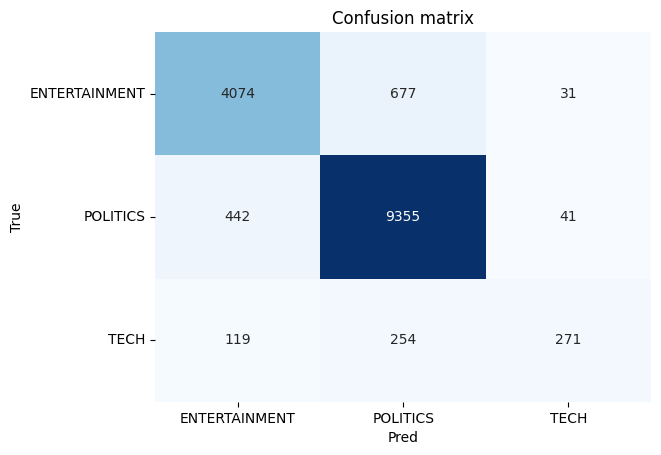

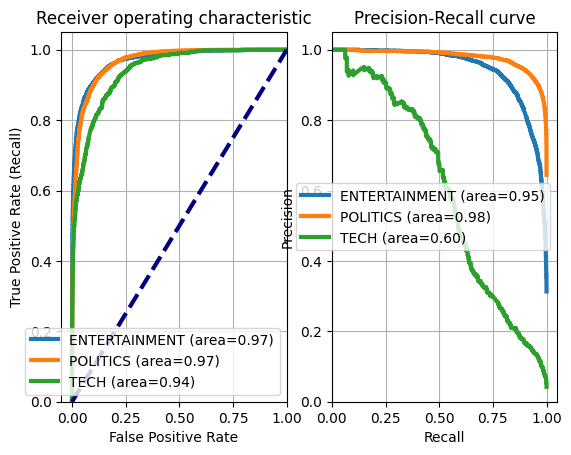

In [ ]:
plot_metrics(y_test, predicted)

The BoW model got 89% of the test set right (Accuracy is 0.89), but struggles to recognize Tech news (only 226 predicted correctly).

## Model explainability

Let’s try to understand why the model classifies news with a certain category and assess the explainability of these predictions.

The `lime` package can help us to build an explainer. To give an illustration, we will take a random observation from the test set and see what the model predicts and why:

In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=d24f990fc825cc58cdd9154f8e139e74acd5483c23396c3614473b2ab4436f4d
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


In [ ]:
from lime import lime_text

# Define a wrapper function to reshape the input for predict_proba
def predict_proba_wrapper(texts):
  text_data = vectorizer.fit_transform(texts) # Transform the texts
  return model.predict_proba(text_data)

## select one observation
i = 10
text = dtf_test["text"].iloc[i]
print(text)
print("True:", y_test.iloc[i], "--> Pred:", predicted[i], "| Prob:", round(np.max(predicted_prob[i]),2))

class_names = ['ENTE', 'POLI', 'TECH']
explainer = lime_text.LimeTextExplainer(class_names=class_names)
explained = explainer.explain_instance(text, predict_proba_wrapper, num_features=4, top_labels=3)
explained.show_in_notebook(text=text, predict_proba=True)

Obama Asks Silicon Valley To Cooperate More Against Cyberattacks
True: POLITICS --> Pred: POLITICS | Prob: 0.94


# Word Embedding


## Introduction

Word Embedding is the collective name for feature learning techniques where words from the vocabulary are mapped to vectors of real numbers.

These vectors are calculated from the probability distribution for each word appearing before or after another.

To put it another way, words of the same context usually appear together in the corpus, so they will be close in the vector space as well.

For instance, let’s take the 3 sentences from the previous example:

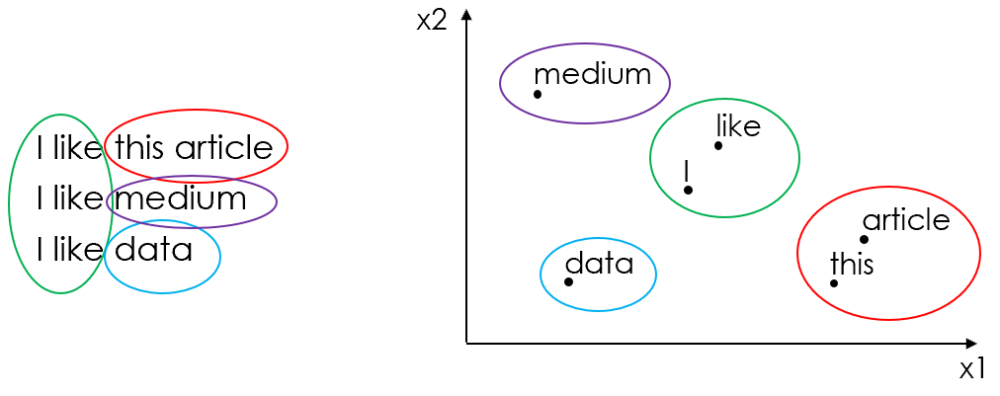

In this tutorial, We are going to use the first model of this family: Google’s **Word2Vec** (2013).

Other popular Word Embedding models are Stanford’s **GloVe** (2014)and Facebook’s **FastText** (2016).

## Word2Vec and Gensim

Word2Vec produces a vector space, typically of several hundred dimensions, with each unique word in the corpus such that words that share common contexts in the corpus are located close to one another in the space.

We can load a pre-trained Word Embedding model from `genism-data` like this:

In [ ]:
import gensim.downloader as gensim_api

w2v_model = gensim_api.load('word2vec-google-news-300')

[==================================================] 100.0% 1662.8/1662.8MB downloaded


In [ ]:
!pip install gensim

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.9/27.9 MB 81.5 MB/s eta 0:00:00


Instead of using a pre-trained model, in this tutorial, we will fit our own Word2Vec on the training data corpus with `gensim`.

Before fitting the model, the corpus needs to be transformed into a list of lists of n-grams. In this particular case, we’ll try to capture unigrams (“york”), bigrams (“new york”), and trigrams (“new york city”).

In [ ]:
import gensim

corpus = dtf["text_clean"]

## create list of lists of unigrams
lst_corpus = []
for string in corpus:
   lst_words = string.split()
   lst_grams = [" ".join(lst_words[i:i+1]) for i in range(0, len(lst_words), 1)]
   lst_corpus.append(lst_grams)

print(len(lst_corpus))
print(lst_corpus)

## detect bigrams and trigrams
bigrams_detector = gensim.models.phrases.Phrases(lst_corpus, delimiter=" ", min_count=5, threshold=10)
bigrams_detector = gensim.models.phrases.Phraser(bigrams_detector)
trigrams_detector = gensim.models.phrases.Phrases(bigrams_detector[lst_corpus], delimiter=" ", min_count=5, threshold=10)
trigrams_detector = gensim.models.phrases.Phraser(trigrams_detector)

lst_corpus = list(bigrams_detector[lst_corpus])
lst_corpus = list(trigrams_detector[lst_corpus])

# print list of n-grams
print(lst_corpus)

50879
[['smith', 'join', 'diplo', 'nicky', 'jam', '2018', 'world', 'cup', 'official', 'song'], ['hugh', 'grant', 'marries', 'first', 'time', 'age', '57'], ['jim', 'carrey', 'blast', 'castrato', 'adam', 'schiff', 'democrat', 'new', 'artwork'], ['julianna', 'margulies', 'us', 'donald', 'trump', 'poop', 'bag', 'pick', 'dog'], ['morgan', 'freeman', 'devastated', 'sexual', 'harassment', 'claim', 'could', 'undermine', 'legacy'], ['donald', 'trump', 'lovin', 'new', 'mcdonalds', 'jingle', 'tonight', 'show', 'bit'], ['watch', 'amazon', 'prime', 'thats', 'new', 'week'], ['mike', 'myers', 'reveals', 'hed', 'like', 'fourth', 'austin', 'power', 'film'], ['watch', 'hulu', 'thats', 'new', 'week'], ['justin', 'timberlake', 'visit', 'texas', 'school', 'shooting', 'victim'], ['trump', 'crackdown', 'immigrant', 'parent', 'put', 'kid', 'already', 'strained', 'system'], ['trump', 'son', 'concerned', 'fbi', 'obtained', 'wiretap', 'putin', 'ally', 'met', 'trump', 'jr'], ['edward', 'snowden', 'there', 'one', 

The code in this cell prepares the cleaned text data for Word2Vec training.

1.  It imports the `gensim` library.
2.  It creates a list of lists where each inner list contains the words (unigrams) from a single headline.
3.  It uses `gensim`'s `Phrases` and `Phraser` to detect and combine frequently occurring bigrams and trigrams within the corpus.
4.  It updates the list of lists to include these detected n-grams.

The output shows the total number of headlines and the list of lists before and after the bigram and trigram detection. This process transforms the text data into sequences of unigrams and detected multi-word phrases (n-grams) for better representation in the Word2Vec model.

## Create custom word2vec model


When fitting the Word2Vec, we need to specify:

* the target size of the word vectors `vector_size`, we’ll use 300;
* the window, or the maximum distance between the current and predicted word within a sentence, we’ll use the mean length of text in the corpus;
* the training algorithm, we’ll use skip-grams (sg=1) as in general it has better results.

In [ ]:
## fit w2v
w2v_model = gensim.models.word2vec.Word2Vec(lst_corpus, vector_size=300, window=8, min_count=1, sg=1, epochs=30)

In [ ]:
word = 'data'
print(w2v_model.wv.get_vector(word).shape)

# total numberof extracted words.
vocab = list(w2v_model.wv.key_to_index.keys())
print("The total number of words are : ",len(vocab))

(300,)
The total number of words are :  28884


The code in these cells trains a Word2Vec model on your text data. It uses the `gensim` library to create word embeddings, where each unique word or phrase is represented by a 300-dimensional vector. The output confirms the vector size for a sample word ('data') and shows the total number of unique words (vocabulary size) found in your corpus after training.

## Tokenizer

Now we integer encode the words in the corpus using Keras `tokenizer`.

Note that there two important variables: which are the `vocab_size` which is the total no of unique words while the second is `max_len` which is the length of every headlines after padding.

Both of these are required by the Keras embedding layer.

In [ ]:
from tensorflow.keras import preprocessing

tokenizer = preprocessing.text.Tokenizer(lower=True, split=' ', oov_token="NaN", filters='!"#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n')
tokenizer.fit_on_texts(lst_corpus)
dic_vocabulary = tokenizer.word_index

max_len = 15
vocab_size = len(dic_vocabulary)+1
print(vocab_size)
print(dic_vocabulary)

28886
{'NaN': 1, 'trump': 2, 'donald trump': 3, 'say': 4, 'new': 5, 'u': 6, 'republican': 7, 'obama': 8, 'hillary clinton': 9, 'get': 10, 'gop': 11, 'want': 12, 'democrat': 13, 'call': 14, 'make': 15, 'american': 16, 'one': 17, 'show': 18, 'woman': 19, 'time': 20, 'state': 21, 'first': 22, 'people': 23, 'here': 24, 'president': 25, 'america': 26, 'could': 27, 'white house': 28, 'watch': 29, 'may': 30, 'day': 31, 'take': 32, 'plan': 33, 'report': 34, 'year': 35, 'bernie sander': 36, 'back': 37, 'vote': 38, 'campaign': 39, 'congress': 40, 'movie': 41, 'video': 42, 'bill': 43, 'big': 44, 'still': 45, 'win': 46, 'would': 47, 'way': 48, 'star': 49, 'wont': 50, 'clinton': 51, 'election': 52, 'like': 53, 'give': 54, 'go': 55, 'senate': 56, 'think': 57, 'love': 58, 'support': 59, 'fight': 60, 'supreme court': 61, 'twitter': 62, 'right': 63, 'attack': 64, 'top': 65, 'man': 66, 'talk': 67, 'help': 68, 'former': 69, 'need': 70, 'voter': 71, 'war': 72, 'tell': 73, 'trailer': 74, 'best': 75, 'life'

Now for each headline text in the corpus, we will create a corresponding sequence of word id sequence with maximum length 15 elements.

To do so, we will use `texts_to_sequences` and `pad_sequences` methods:

In [ ]:
lst_text2seq= tokenizer.texts_to_sequences(lst_corpus)
input_data = preprocessing.sequence.pad_sequences(lst_text2seq, maxlen=max_len, padding="post", truncating="post")
print(input_data.shape)

(50879, 15)


The input data has a shape of 50,879 x 15 (Number of sequences x Sequences max length).

Let’s visualize it:

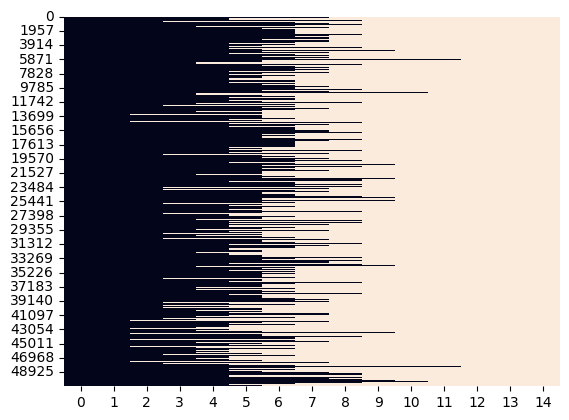

In [ ]:
sns.heatmap(input_data==0, vmin=0, vmax=1, cbar=False)
plt.show()

Every headline text in the corpus is now an id sequence with length 15.

For instance, if a text had 10 tokens in it, then the sequence is composed of 10 ids + 5 0s, which is the padding element (while the id for word not in the vocabulary is 1).

Let’s print how a text from the input data has been transformed into a sequence with the padding and the vocabulary:

In [ ]:
i = 0

## list of text:
len_txt = len(dtf["text_clean"].iloc[i].split())
print("from: ", dtf["text_clean"].iloc[i], "| len:", len_txt)

## sequence of token ids:
len_tokens = len(input_data[i])
print("to: ", input_data[i], "| len:", len(input_data[i]))

## vocabulary:
print("check: ", dtf["text_clean"].iloc[i].split()[0],
      " -- idx in vocabulary -->",
      dic_vocabulary[dtf["text_clean"].iloc[i].split()[0]])

print(dic_vocabulary)
print("Vocab size: ", vocab_size)

from:  smith join diplo nicky jam 2018 world cup official song | len: 10
to:  [ 543  341 9154 9155 3061  470   77 4543   94  209    0    0    0    0
    0] | len: 15
check:  smith  -- idx in vocabulary --> 543
{'NaN': 1, 'trump': 2, 'donald trump': 3, 'say': 4, 'new': 5, 'u': 6, 'republican': 7, 'obama': 8, 'hillary clinton': 9, 'get': 10, 'gop': 11, 'want': 12, 'democrat': 13, 'call': 14, 'make': 15, 'american': 16, 'one': 17, 'show': 18, 'woman': 19, 'time': 20, 'state': 21, 'first': 22, 'people': 23, 'here': 24, 'president': 25, 'america': 26, 'could': 27, 'white house': 28, 'watch': 29, 'may': 30, 'day': 31, 'take': 32, 'plan': 33, 'report': 34, 'year': 35, 'bernie sander': 36, 'back': 37, 'vote': 38, 'campaign': 39, 'congress': 40, 'movie': 41, 'video': 42, 'bill': 43, 'big': 44, 'still': 45, 'win': 46, 'would': 47, 'way': 48, 'star': 49, 'wont': 50, 'clinton': 51, 'election': 52, 'like': 53, 'give': 54, 'go': 55, 'senate': 56, 'think': 57, 'love': 58, 'support': 59, 'fight': 60, 

The code in these cells focuses on tokenizing and preparing the text data for use in a neural network.

1.  **Initialize and Fit Tokenizer:** It initializes a Keras Tokenizer, which builds a vocabulary from the text and assigns a unique integer ID to each word/n-gram. It also sets the maximum length for sequences and calculates the vocabulary size.
2.  **Convert Text to Sequences and Pad:** It converts each headline into a sequence of corresponding integer IDs and then pads these sequences to a uniform length of 15.
3.  **Visualize Padding:** A heatmap is generated to visually show the padding (represented by 0s) in the padded sequences.
4.  **Illustrate Transformation:** An example is shown demonstrating how a sample headline is transformed into its padded sequence of IDs, including the mapping of a word to its ID.

The output includes the vocabulary size and dictionary, the shape of the padded input data (50879, 15), a heatmap visualizing the padding, and the detailed example of a headline converted to a padded sequence of IDs. This process is essential for preparing text data for fixed-length input neural networks.

## Create the embedding matrix

Now we need to pass the w2v word embeddings to the embedding layer in Keras.

For this we will create the embedding matrix and pass it as `embedding_initializer` parameter to the layer.

The embedding matrix will be of dimensions `(vocab_size, embed_dim)` where the word_index of each word from keras tokenizer is its index into the matrix and the corressponding entry is its w2v vector.

Note that there may be words which will not be present in embeddings learnt by the w2v model. In this case, the embedding matrix entry corressponding to those words will be a vector of all zeros.



In [ ]:
## start the matrix (length of vocabulary x vector size) with all 0s
embeddings = np.zeros(shape=(vocab_size, 300))
for word, idx in dic_vocabulary.items():
    ## update the row with vector
    try:
        embeddings[idx] = w2v_model.wv.get_vector(word)
    ## if word not in model then skip and the row stays all 0s
    except:
        pass

print(embeddings.shape)

(28886, 300)


That code generates a matrix of shape 28,886 x 300 (Length of vocabulary extracted from the corpus x Vector size).

It can be navigated by word id, which can be obtained from the vocabulary:

In [ ]:
word = "data"
print("dic[word]:", dic_vocabulary[word], "|idx")
print("embeddings[idx]:", embeddings[dic_vocabulary[word]].shape, "|vector")

dic[word]: 422 |idx
embeddings[idx]: (300,) |vector


The code in these cells creates the embedding matrix that will be used in the Embedding layer of a neural network.

1.  It initializes a NumPy array of zeros with dimensions (vocabulary size, vector size).
2.  It iterates through the vocabulary created by the Keras Tokenizer and populates the embedding matrix with the corresponding word vectors from the trained Word2Vec model. If a word is not found in the Word2Vec model, its vector in the matrix remains zeros.
3.  It prints the shape of the resulting embedding matrix and demonstrates how to access the vector for a specific word using its ID from the tokenizer's vocabulary.

The output confirms that the embedding matrix has the expected shape (vocabulary size, vector size) and shows the shape of the vector for a sample word. This matrix serves as a lookup table for word embeddings in the neural network model.

## Create training and testing datasets

Now we can create our traning and testing datasets:
1. We create output data from the `dtf['label']` column. Because the output data is categorical, so we will use one-hot encoding to encode the output data.
2. We split the original dataframe into training and testing dataframe with `test_size = 0.3`.
3. We convert the headlines in the column `'text_clean'` in training and testing dataframe into input data for the training set and the testing set.



In [ ]:
from sklearn.model_selection import train_test_split

dtf_labels = pd.get_dummies(dtf['label'])
dtf_labels.replace({False: 0, True: 1}, inplace=True)
y = dtf_labels.to_numpy()

dtf_train, dtf_test, y_train, y_test = train_test_split(dtf, y, test_size=0.3, random_state=20)

/tmp/ipython-input-3961030957.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  dtf_labels.replace({False: 0, True: 1}, inplace=True)


In [ ]:
# Create training and testing set
import gensim

train_headlines = dtf_train["text_clean"]
test_headlines = dtf_test["text_clean"]

## create list of lists of unigrams for training and testing headlines
lst_train_headlines = []
for string in train_headlines:
   lst_words = string.split()
   lst_grams = [" ".join(lst_words[i:i+1]) for i in range(0, len(lst_words), 1)]
   lst_train_headlines.append(lst_grams)

lst_test_headlines = []
for string in test_headlines:
   lst_words = string.split()
   lst_grams = [" ".join(lst_words[i:i+1]) for i in range(0, len(lst_words), 1)]
   lst_test_headlines.append(lst_grams)

## detect bigrams and trigrams
lst_train_headlines = list(bigrams_detector[lst_train_headlines])
lst_train_headlines = list(trigrams_detector[lst_train_headlines])

lst_test_headlines = list(bigrams_detector[lst_test_headlines])
lst_test_headlines = list(trigrams_detector[lst_test_headlines])

lst_train_text2seq = tokenizer.texts_to_sequences(lst_train_headlines)
X_train = preprocessing.sequence.pad_sequences(lst_train_text2seq, maxlen=max_len, padding="post", truncating="post")

lst_test_text2seq = tokenizer.texts_to_sequences(lst_test_headlines)
X_test = preprocessing.sequence.pad_sequences(lst_test_text2seq, maxlen=max_len, padding="post", truncating="post")

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(35615, 15) (35615, 3)
(15264, 15) (15264, 3)


The following code shows examples of 50th items in the training and testing set:

In [ ]:
labels = dtf_labels.columns

i = 50
print(dtf_train['text_clean'].iloc[i], ' | ', labels[y_train[i].argmax()])
print(X_train[i], '-->', y_train[i])

print(dtf_test['text_clean'].iloc[i], ' | ', labels[y_test[i].argmax()])
print(X_test[i], '-->', y_test[i])

heat originally written tina fey amy poehler  |  ENTERTAINMENT
[1349 8381 7440 1541 2923    0    0    0    0    0    0    0    0    0
    0] --> [1 0 0]
nyc labor may break police union  |  POLITICS
[1033 1517   30  194 4509    0    0    0    0    0    0    0    0    0
    0] --> [0 1 0]


The code in the cells above shows examples of how individual samples from the training and testing datasets are represented after preprocessing, tokenization, and padding.

It prints the cleaned text and true label for the 50th sample in both the training and testing sets. Below each text and label, it prints the corresponding padded sequence of integer IDs and the one-hot encoded label array.

The output demonstrates that each headline is transformed into a fixed-length sequence of numbers (IDs) with padding, and the category labels are converted into a one-hot encoded format (e.g., `[1 0 0]` for the first category). This is the required input and output format for training the LSTM model.

## Specify a LSTM model

It is time to build a LSTM model.

We are going to use the embedding matrix in the first Embedding layer of the LSTM network that we will build and train to classify the headlines.

Each `id` in the input sequence will be used as the index to access the embedding matrix.

The output of this Embedding layer will be a 2D matrix with a word vector for each word id in the input sequence (Sequence length x Vector size).

Let’s use the sentence “I like this article” as an example:

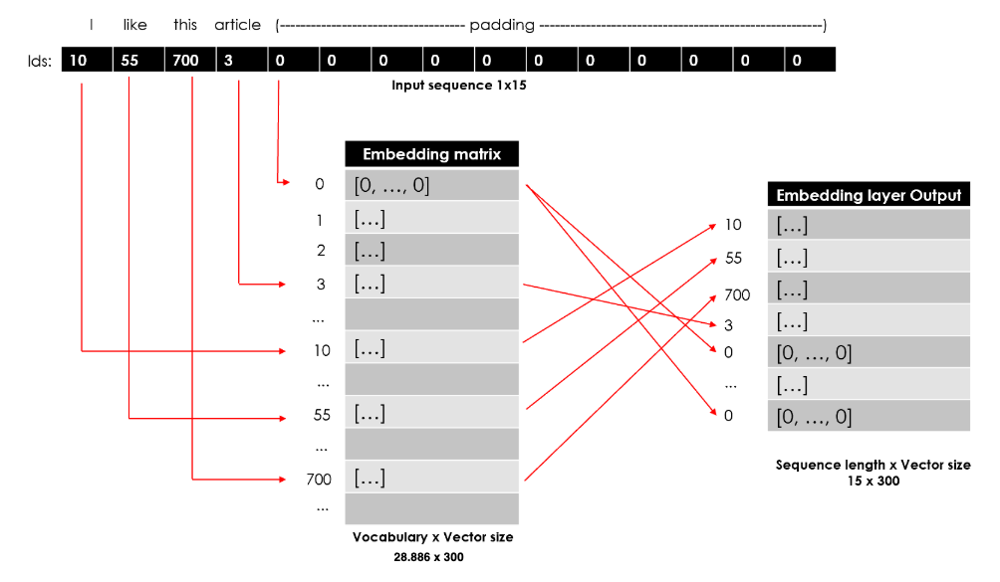

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Flatten, Dense

def create_LSTM(embeddings):
  model = Sequential()
  model.add(Embedding(input_dim = embeddings.shape[0], output_dim = embeddings.shape[1], weights=[embeddings], input_length=15, trainable=False))
  model.add(LSTM(units = 256))
  model.add(Flatten())
  model.add(Dense(units = 64,activation='relu'))
  model.add(Dense(units = 3, activation = 'softmax'))
  return model

In [ ]:
# Specify, compile and train the model
model = create_LSTM(embeddings)
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# specify batch size and epochs for training.
epochs=10
batch_size=256
training = model.fit(x=X_train, y=y_train, batch_size=batch_size, epochs=epochs, shuffle=True, validation_split=0.3)

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/embedding.py:97: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Epoch 1/10
98/98 ━━━━━━━━━━━━━━━━━━━━ 33s 316ms/step - accuracy: 0.8111 - loss: 0.4810 - val_accuracy: 0.9137 - val_loss: 0.2489
Epoch 2/10
98/98 ━━━━━━━━━━━━━━━━━━━━ 37s 379ms/step - accuracy: 0.9211 - loss: 0.2263 - val_accuracy: 0.9154 - val_loss: 0.2397
Epoch 3/10
98/98 ━━━━━━━━━━━━━━━━━━━━ 35s 315ms/step - accuracy: 0.9270 - loss: 0.2059 - val_accuracy: 0.9175 - val_loss: 0.2279
Epoch 4/10
98/98 ━━━━━━━━━━━━━━━━━━━━ 41s 312ms/step - accuracy: 0.9342 - loss: 0.1890 - val_accuracy: 0.9255 - val_loss: 0.2152
Epoch 5/10
98/98 ━━━━━━━━━━━━━━━━━━━━ 30s 303ms/step - accuracy: 0.9388 - loss: 0.1720 - val_accuracy: 0.9258 - val_loss: 0.2196
Epoch 6/10
98/98 ━━━━━━━━━━━━━━━━━━━━ 41s 304ms/step - accuracy: 0.9413 - loss: 0.1673 - val_accuracy: 0.9260 - val_loss: 0.2139
Epoch 7/10
98/98 ━━━━━━━━━━━━━━━━━━━━ 31s 313ms/step - accuracy: 0.9464 - loss: 0.1481 - val_accuracy: 0.9270 - val_loss: 0.2289
Epoch 8/10
98/98 ━━━━━━━━━━━━━━━━━━━━ 30s 302ms/step - accuracy: 0.9519 - loss: 0.1308 - val_accu

In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding (Embedding)           │ (None, 15, 300)        │     8,665,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 256)            │       570,368 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,426,835 (39.78 MB)

 Trainable params: 587,011 (2.24 MB)

 Non-trainable params: 8,665,800 (33.06 MB)

 Optimizer params: 1,174,024 (4.48 MB)

Plot loss and accuracy

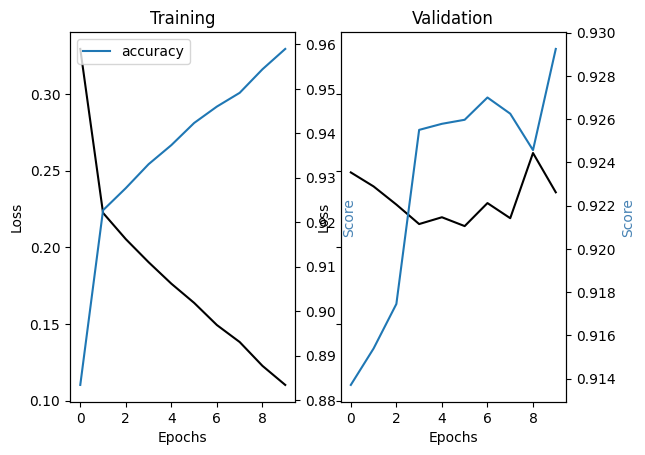

In [ ]:
## plot loss and accuracy
metrics = [k for k in training.history.keys() if ("loss" not in k) and ("val" not in k)]
fig, ax = plt.subplots(nrows=1, ncols=2, sharey=True)
ax[0].set(title="Training")
ax11 = ax[0].twinx()
ax[0].plot(training.history['loss'], color='black')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss', color='black')
for metric in metrics:
    ax11.plot(training.history[metric], label=metric)
ax11.set_ylabel("Score", color='steelblue')
ax11.legend()

ax[1].set(title="Validation")
ax22 = ax[1].twinx()
ax[1].plot(training.history['val_loss'], color='black')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss', color='black')
for metric in metrics:
     ax22.plot(training.history['val_' + metric], label=metric)
ax22.set_ylabel("Score", color="steelblue")

plt.show()

In [ ]:
model.save('word_embedding_lstm_text_classification_v1.keras')

The code in these cells defines, trains, evaluates, and saves an LSTM model for text classification using the Word Embedding approach.

1.  **Define LSTM Model:** It defines a sequential Keras model with an Embedding layer (using the pre-computed embeddings), an LSTM layer, a Flatten layer, and two Dense layers for classification.
2.  **Specify, Compile, and Train Model:** It creates an instance of the model, compiles it with categorical crossentropy loss and Adam optimizer, and trains it on the training data for 10 epochs with a batch size of 256 and a 30% validation split.
3.  **Model Summary:** It prints a summary of the model's architecture.
4.  **Plot Loss and Accuracy:** It plots the training and validation loss and accuracy over the epochs.
5.  **Save Model:** It saves the trained model to a file.

The output shows the training progress, the model summary, the loss and accuracy plots, and confirmation of the model being saved.

## Evaluate the model


A pre-trained model can be downloaded from the following link:

[https://drive.google.com/file/d/1p0oynhUTmh55emzqgbg0a5JkMBLZtjG5/view?usp=sharing](https://drive.google.com/file/d/1p0oynhUTmh55emzqgbg0a5JkMBLZtjG5/view?usp=sharing)

In [ ]:
# Load the pre-trained model

from tensorflow.keras.models import load_model

model = load_model('word_embedding_lstm_text_classification_v1.keras')

predicted_prob = model.predict(X_test)

477/477 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step


In [ ]:
labels = dtf_labels.columns
predicted = [labels[pred.argmax()] for pred in predicted_prob]
predicted = np.array(predicted)
y_test_dtf = dtf_test['label']

In [ ]:
from sklearn import metrics

print_metrics(metrics, y_test_dtf, predicted)

Accuracy: 0.93
Auc: 0.97
Detail:
               precision    recall  f1-score   support

ENTERTAINMENT       0.90      0.92      0.91      4782
     POLITICS       0.96      0.95      0.95      9838
         TECH       0.75      0.66      0.70       644

     accuracy                           0.93     15264
    macro avg       0.87      0.84      0.86     15264
 weighted avg       0.93      0.93      0.93     15264



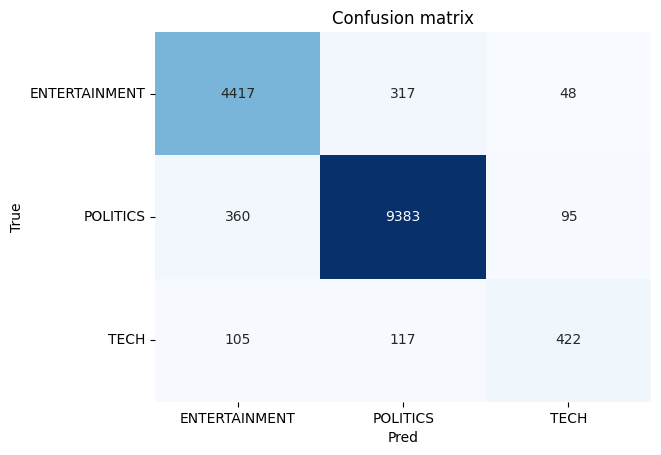

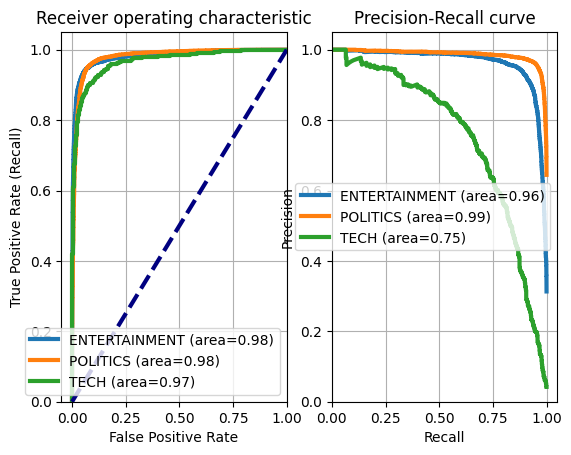

In [ ]:
plot_metrics(y_test_dtf, predicted)

The code in these cells evaluates the performance of the trained Word Embedding + LSTM model.

1.  **Load Model and Make Predictions:** It loads the saved Keras model and uses it to predict class probabilities for the test data.
2.  **Convert Probabilities to Class Labels:** It converts the predicted probabilities into the final predicted category labels by selecting the class with the highest probability for each sample.
3.  **Print Evaluation Metrics:** It uses the `print_metrics` function to display various metrics, including Accuracy, AUC, and a classification report (precision, recall, f1-score) for each class.
4.  **Plot Evaluation Metrics:** It uses the `plot_metrics` function to generate a confusion matrix, ROC curves, and Precision-Recall curves to visually assess the model's performance.

The output includes the predicted probabilities, the printed evaluation metrics showing the overall performance and per-class scores, and the generated plots providing a visual summary of the model's evaluation.

The Word Embedding + LSTM model performs better than the previous one. It got 93% of the test set right (Accuracy is 0.93).

However, it still struggles to classify Tech news (around 427 headlines predicted correctly).

# Transformer

In [ ]:
!pip install tensorflow_text

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import tensorflow_text as text
import tensorflow_hub as hub

In [ ]:
bert_handle = 'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-512_A-8/2'
preprocessing_model = 'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3'

In [ ]:
preprocess_layer = hub.KerasLayer(preprocessing_model)

In [ ]:
sample_news = ['Tech rumors: The tech giant Apple is working on its self driving car']

preprocessed_news = preprocess_layer(sample_news)

print(f'Keys       : {list(preprocessed_news.keys())}')
print(f'Shape      : {preprocessed_news["input_word_ids"].shape}')
print(f'Word Ids   : {preprocessed_news["input_word_ids"][0, :5]}')
print(f'Input Mask : {preprocessed_news["input_mask"][0, :5]}')
print(f'Type Ids   : {preprocessed_news["input_type_ids"][0, :5]}')

Keys       : ['input_type_ids', 'input_mask', 'input_word_ids']
Shape      : (1, 128)
Word Ids   : [  101  6627 11256  1024  1996]
Input Mask : [1 1 1 1 1]
Type Ids   : [0 0 0 0 0]


In [ ]:
bert_model = hub.KerasLayer(bert_handle)

In [ ]:
bert_outputs = bert_model(preprocessed_news)

print(f'Pooled output shape:{bert_outputs["pooled_output"].shape}')
print(f'Pooled output values:{bert_outputs["pooled_output"][0, :5]}')
print(f'Sequence output shape:{bert_outputs["sequence_output"].shape}')
print(f'Sequence output values:{bert_outputs["sequence_output"][0, :5]}')

Pooled output shape:(1, 512)
Pooled output values:[ 0.9445978   0.9861868  -0.15102875  0.17372076 -0.64245623]
Sequence output shape:(1, 128, 512)
Sequence output values:[[-0.60826164  0.26230305  1.2436793  ... -0.88217264  0.36095393
  -0.00184689]
 [ 0.33820498  0.07993765  1.1374027  ... -1.643891   -1.0649078
  -0.73716927]
 [-0.60549146 -0.14994538  0.8464852  ... -0.74730515  0.8475889
   0.13153368]
 [ 0.06869027  0.6969761   1.5265325  ... -0.768091   -0.30986038
   0.2501719 ]
 [-1.2314897   1.4334058  -0.377469   ... -1.3110949  -0.01984622
   0.79048693]]


The code in these cells sets up and demonstrates how to use pre-trained BERT preprocessing and encoding layers from TensorFlow Hub.

1.  **Import Libraries:** Imports necessary libraries for TensorFlow and TensorFlow Hub.
2.  **Define Hub Handles:** Defines the URLs for the pre-trained BERT model and its compatible preprocessing model.
3.  **Load Preprocessing Layer:** Loads the preprocessing model as a Keras Layer.
4.  **Demonstrate Preprocessing:** Shows how the preprocessing layer converts raw text into the numerical tensor format expected by the BERT encoder, printing the output keys, shapes, and sample values.
5.  **Load BERT Encoding Layer:** Loads the BERT encoder model as a Keras Layer.
6.  **Demonstrate BERT Encoding:** Shows how the BERT encoder takes the preprocessed tensors and generates context-aware embeddings, printing the shapes and sample values of the `pooled_output` and `sequence_output`.

The output confirms the successful loading and application of the BERT preprocessing and encoding steps, showing the transformation of sample text into the numerical formats and embeddings produced by the BERT model.

In [ ]:
input_text = tf.keras.layers.Input(shape=(), dtype=tf.string, name='Input')

# A preprocesing model before layer BERT
preprocessing_layer = hub.KerasLayer(preprocessing_model, name='preprocessing_layer')

bert_input = preprocessing_layer(input_text)

# Getting a Bert model, set trainable to True
bert_encoder = hub.KerasLayer(bert_handle, trainable=True, name='bert_encoder')

bert_outputs = bert_encoder(bert_input)

# For finetuning, we take pooled_output
pooled_bert_output = bert_outputs['pooled_output']

# Adding a dense layer

dense_net = tf.keras.layers.Dense(16, activation='relu', name='fully_connected_layer')(pooled_bert_output)
# Add dropout layer for regularization
dense_net = tf.keras.layers.Dropout(0.2)(dense_net)

# Last dense layer for classification purpose
final_output = tf.keras.layers.Dense(3, activation='softmax', name='classifier')(dense_net)

# Combine input and output

news_classifier = tf.keras.Model(input_text, final_output)

ValueError: Exception encountered when calling layer 'preprocessing_layer' (type KerasLayer).

A KerasTensor is symbolic: it's a placeholder for a shape an a dtype. It doesn't have any actual numerical value. You cannot convert it to a NumPy array.

Call arguments received by layer 'preprocessing_layer' (type KerasLayer):
  • inputs=<KerasTensor shape=(None,), dtype=string, sparse=False, ragged=False, name=Input>
  • training=None

In [ ]:
# @title
news_classifier.summary()

NameError: name 'news_classifier' is not defined

In [ ]:
news_classifier.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=3e-5),
                        loss='categorical_crossentropy',
                        metrics=['accuracy'])

In [ ]:
from sklearn.model_selection import train_test_split

dtf_labels = pd.get_dummies(dtf['label'])
dtf_labels.replace({False: 0, True: 1}, inplace=True)
y = dtf_labels.to_numpy()

dtf_train, dtf_test, y_train, y_test = train_test_split(dtf, y, test_size=0.3, random_state=20)

X_train = dtf_train['text']
X_test = dtf_test['text']

In [ ]:
# specify batch size and epochs for training.
epochs=10
batch_size=256
training = news_classifier.fit(x=X_train, y=y_train, batch_size=batch_size, epochs=epochs, shuffle=True, validation_split=0.3)

In [ ]:
model_name = 'bert_base_en_uncased'

classifier = keras_hub.models.BertClassifier.from_preset(
  model_name,
  activation='softmax',
  load_weights = True,
  num_classes=3,
)

The code in these cells sets up, compiles, and trains a BERT-based text classification model using the `keras_hub.models.BertClassifier.from_preset` method.

1.  **Define and Build Classifier from Preset:** It creates a BERT classifier model directly from a pre-trained preset, specifying the base BERT model, output activation, weight loading, and number of classes.
2.  **Compile Model:** It configures the model for training with categorical crossentropy loss, Adam optimizer, and accuracy as a metric.
3.  **Prepare Data:** It splits the data into training and testing sets (`X_train`, `y_train`, `X_test`, `y_test`).
4.  **Train Model:** It trains the model on the training data for a specified number of epochs and batch size, using a portion of the training data for validation.

The output shows the training progress of the model over the epochs, including the loss and accuracy on both the training and validation datasets.

In [ ]:
classifier.compile(
    loss=keras.losses.CategoricalCrossentropy(),
    optimizer=keras.optimizers.Adam(),
     metrics=["accuracy"],
)

In [ ]:
# Fit again.
classifier.fit(x=X_train, y=y_train, batch_size=256, epochs=3, validation_split=0.2)

In [ ]:
preset_dir = "./tiny_bert_text_classification"
classifier.save_to_preset(preset_dir)

In [ ]:
!zip -r ./tiny_bert_text_classification.zip ./tiny_bert_text_classification

In [ ]:
predicted_prob = classifier.predict(X_test)

In [ ]:
labels = dtf_labels.columns
predicted = [labels[pred.argmax()] for pred in predicted_prob]
predicted = np.array(predicted)
y_test_dtf = dtf_test['label']

In [ ]:
from sklearn import metrics

print_metrics(metrics, y_test_dtf, predicted)

In [ ]:
plot_metrics(y_test_dtf, predicted)

The code in these cells compiles, trains, saves, and evaluates the BERT classifier created using `keras_hub.models.BertClassifier.from_preset`.

1.  **Compile Model:** It compiles the classifier model with the specified loss, optimizer, and metrics.
2.  **Train Model:** It trains the model on the training data for 3 epochs with a batch size of 256 and a 20% validation split.
3.  **Save Model:** It saves the trained model to a local directory using `save_to_preset`.
4.  **Predict Probabilities:** It uses the trained model to predict class probabilities for the test data.
5.  **Convert Probabilities to Class Labels:** It converts the predicted probabilities to class labels.
6.  **Evaluate Model:** It uses the `print_metrics` and `plot_metrics` functions to display and visualize the model's performance on the test set, including accuracy, AUC, classification report, confusion matrix, ROC curves, and Precision-Recall curves.

The outputs show the training progress, model saving confirmation, prediction progress, and the printed and plotted evaluation results.